In [17]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt

In [20]:
def load_data(name):
    return pd.read_csv(name)

house_data = load_data('housing.csv')

print(house_data.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.5+ MB
None


array([[<AxesSubplot:title={'center':'longitude'}>,
        <AxesSubplot:title={'center':'latitude'}>,
        <AxesSubplot:title={'center':'housing_median_age'}>],
       [<AxesSubplot:title={'center':'total_rooms'}>,
        <AxesSubplot:title={'center':'total_bedrooms'}>,
        <AxesSubplot:title={'center':'population'}>],
       [<AxesSubplot:title={'center':'households'}>,
        <AxesSubplot:title={'center':'median_income'}>,
        <AxesSubplot:title={'center':'median_house_value'}>]],
      dtype=object)

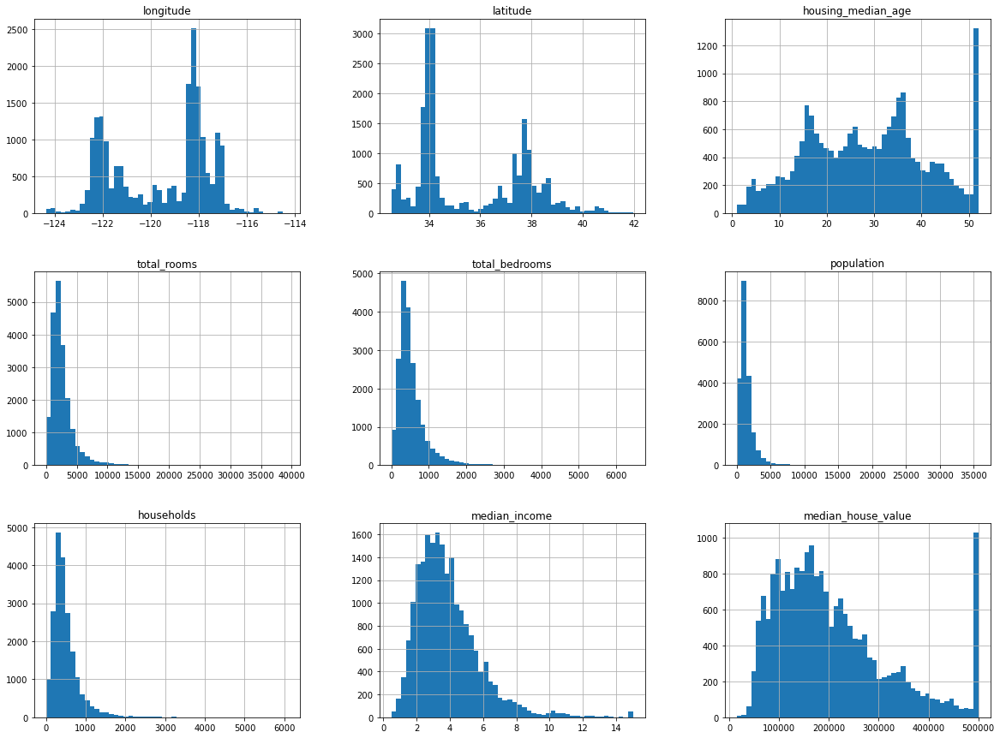

In [21]:
house_data.hist(bins=50 , figsize=(20 , 15))

In [24]:
np.random.seed(42)

def split_data(data : 'data', test_ratio : 'test ratio, eg 0.2') -> "test data, train data":

    shuffle = np.random.permutation(len(data))
    test_size = int(test_ratio * len(data))
    test_indices = shuffle[:test_size]
    train_indices = shuffle[test_size:]

    return data.iloc[test_indices] , data.iloc[train_indices]

train_data , test_data = split_data(house_data, 0.2)

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

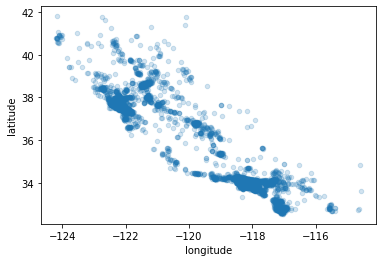

In [25]:
# DATA EXPLORATION

housing = train_data.copy()
housing.plot(kind='scatter', x='longitude', y='latitude', alpha=0.2)

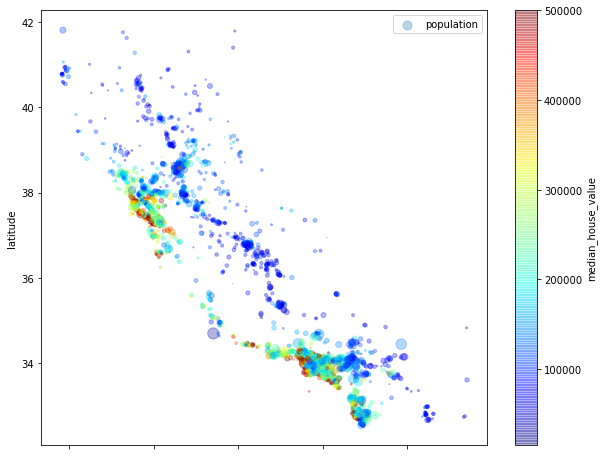

In [26]:

housing.plot(kind='scatter' , x='longitude', y='latitude', alpha=0.3, s=housing['population']/100, c='median_house_value' , cmap='jet', label='population', colorbar=True, figsize=(10, 8))
plt.legend()

In [27]:

correlation = housing.corr()
correlation['median_house_value']

longitude            -0.044062
latitude             -0.149295
housing_median_age    0.113585
total_rooms           0.134697
total_bedrooms        0.056667
population           -0.019003
households            0.074249
median_income         0.677502
median_house_value    1.000000
Name: median_house_value, dtype: float64

array([[<AxesSubplot:xlabel='median_house_value', ylabel='median_house_value'>,
        <AxesSubplot:xlabel='median_income', ylabel='median_house_value'>,
        <AxesSubplot:xlabel='total_rooms', ylabel='median_house_value'>,
        <AxesSubplot:xlabel='housing_median_age', ylabel='median_house_value'>],
       [<AxesSubplot:xlabel='median_house_value', ylabel='median_income'>,
        <AxesSubplot:xlabel='median_income', ylabel='median_income'>,
        <AxesSubplot:xlabel='total_rooms', ylabel='median_income'>,
        <AxesSubplot:xlabel='housing_median_age', ylabel='median_income'>],
       [<AxesSubplot:xlabel='median_house_value', ylabel='total_rooms'>,
        <AxesSubplot:xlabel='median_income', ylabel='total_rooms'>,
        <AxesSubplot:xlabel='total_rooms', ylabel='total_rooms'>,
        <AxesSubplot:xlabel='housing_median_age', ylabel='total_rooms'>],
       [<AxesSubplot:xlabel='median_house_value', ylabel='housing_median_age'>,
        <AxesSubplot:xlabel='median_incom

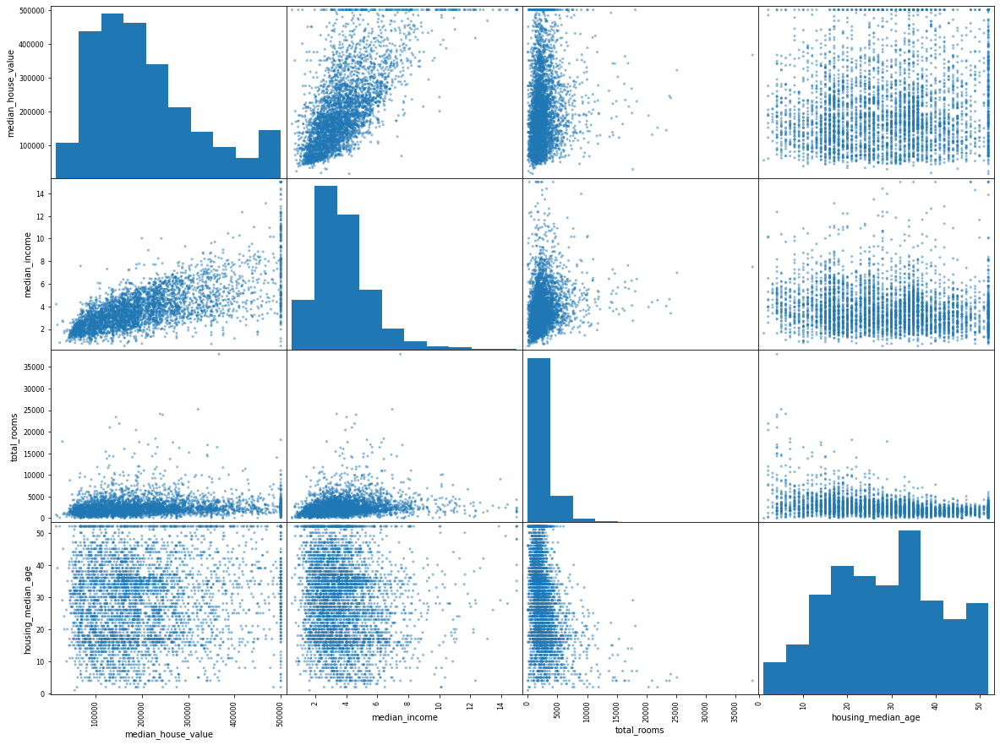

In [8]:

from pandas.plotting import scatter_matrix

attributes = ["median_house_value", "median_income", "total_rooms",
"housing_median_age"]

scatter_matrix(housing[attributes] , figsize=(20, 15))

<AxesSubplot:xlabel='median_income', ylabel='median_house_value'>

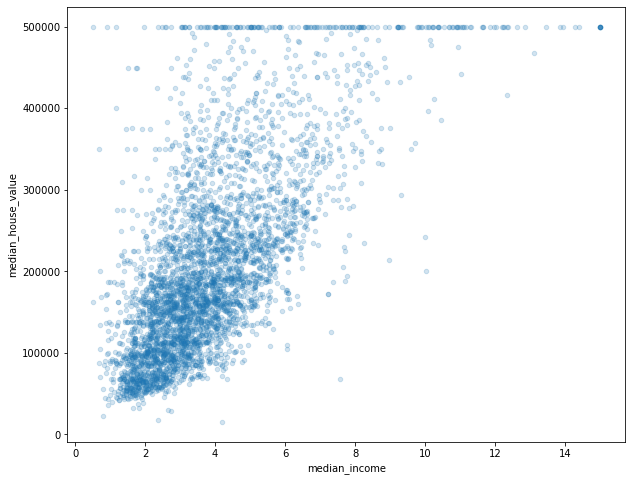

In [9]:

housing.plot(kind='scatter' , x='median_income', y='median_house_value', alpha=0.2, figsize=(10,8))


In [63]:
# PREPARATION FOR ML

housing = train_data.drop("median_house_value", axis=1)
housing_labels = train_data["median_house_value"].copy()

# printing null values
print(housing.isnull().any())

longitude             False
latitude              False
housing_median_age    False
total_rooms           False
total_bedrooms         True
population            False
households            False
median_income         False
ocean_proximity       False
dtype: bool


In [93]:
# DATA CLEANING

from sklearn.impute import SimpleImputer

impute = SimpleImputer(strategy='median')

housing_num = housing.drop('ocean_proximity', axis=1)
impute.fit(housing_num)

X = impute.transform(housing_num)

In [94]:
# JUST VIBES AND INSHALLAH 

temp = housing[['ocean_proximity']]

from sklearn.preprocessing import OrdinalEncoder

check = OrdinalEncoder()
new_temp = check.fit_transform(temp)


In [95]:
housing_cat = housing[['ocean_proximity']]

from sklearn.preprocessing import OneHotEncoder

ordinal = OneHotEncoder()
housing_cat_encoded = ordinal.fit_transform(housing_cat)


In [96]:
# TRANSFORMATION PIPELINES

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

n_pipeline = Pipeline([
    ('imputer' , SimpleImputer(strategy='median')), 
    ('std-scaler', StandardScaler()),
])

In [100]:
# TRANSFORMATION PIPELINE WITH ColumnTransformer

from sklearn.compose import ColumnTransformer

num_attribs = list(housing_num)
cat_attribs = ['ocean_proximity']

full_pipeline = ColumnTransformer([
    ("num", n_pipeline, num_attribs), 
    ("cat", OneHotEncoder(), cat_attribs),
])

housing_prepared = full_pipeline.fit_transform(housing)


In [101]:
# SELECTING AND TRAINING A MODEL

from sklearn.linear_model import LinearRegression

lin_reg = LinearRegression()
lin_reg.fit(housing_prepared, housing_labels)


LinearRegression()

In [105]:
# PREDICTIONS

some_data = housing.iloc[:5]
some_label = housing_labels.iloc[:5]

some_data_prepared = full_pipeline.transform(some_data)

print('predictions: ', lin_reg.predict(some_data_prepared))
print('list: ', list(some_label))

predictions:  [ 54848. 141504. 300800. 271904. 269088.]
list:  [47700.0, 45800.0, 500001.0, 218600.0, 278000.0]


In [108]:
# CHECKING THE PERFORMANCE MEASURE OF OUR MODEL

from sklearn.metrics import mean_squared_error

housing_predictions = lin_reg.predict(housing_prepared)
lin_mse = mean_squared_error(housing_labels, housing_predictions)

lin_rmse = np.sqrt(lin_mse)
print(lin_rmse)

# 69370 is not quite a good error, and this is an example of underfitting, so we could try some more complex models or add feautures or reduce constraints, but the model is not regularized we can't reduce constraints.. so let's try a more complex model

69370.19824469814


In [109]:

from sklearn.tree import DecisionTreeRegressor

tree_reg = DecisionTreeRegressor()
tree_reg.fit(housing_prepared, housing_labels)

housing_predictions2 = tree_reg.predict(housing_prepared)
tree_mse = mean_squared_error(housing_labels, housing_predictions2)
tree_rmse = np.sqrt(tree_mse)

print(tree_rmse)

0.0


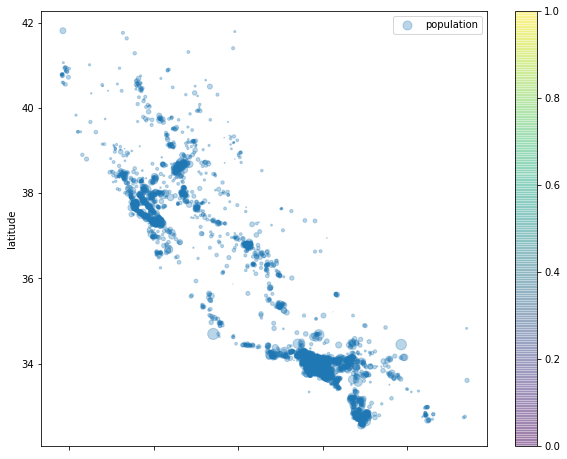